<p style="text-align:left">
    <a href="">
    <img src="https://www.cleartouch.in/wp-content/uploads/2022/11/Customer-Churn.png" width="1000" alt="Laptop Logo"  />
    </a>
</p>


# Telecom Customer Churn Prediction

The Customer Churn table contains information on all 7,043 customers from a Telecommunications company in California in Q2 2022
Each record represents one customer, and contains details about their demographics, location, tenure, subscription services, status for the quarter (joined, stayed, or churned), and more!
The Zip Code Population table contains complimentary information on the estimated populations for the California zip codes in the Customer Churn table

<h3 align="left"><font size="5"><font color="grey">Objective of the Project</font></h3>
    
To predict whether customer with given independant variables, is tend to churn the service or not?

<h3 align="left"><font size="5"><font color="grey">Understanding Problem</font></h3>
    
**Customer Churning :** 

Customer churn or customer attrition is the percentage of customers that have stopped using your organization’s product or service during a specific time frame.

Lets ask few question to figure out in this project :
   
>1. **Why customers are churning?** 
2. **Is there any particular parameter has high churning rate?**
    



### Setup
For this lab, we will be using the following libraries:

In [251]:
import pandas as pd
from ydata_profiling import ProfileReport 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scipy as scipy
import skillsnetwork as skillsnetwork
import sqlite3 as sq3
import pandas.io.sql as pds

import warnings 
warnings.filterwarnings('ignore')

### Loading data from CSV available on URL

In [252]:
import skillsnetwork
## Loading the district wise Data
URL = 'https://raw.githubusercontent.com/geek-vinit/Internship/main/telecom_customer_churn.csv'

await skillsnetwork.download_dataset(URL)

Saved as 'telecom_customer_churn.csv'


In [253]:
#Creating new dataframe for the datset 
df = pd.read_csv('telecom_customer_churn.csv',encoding='latin-1')

df_copy = df

#enabling to display all the columns at a once
pd.set_option('display.max_columns', None)

df.head(10)

,Customer ID,Gender,Age,Married,Number of Dependents,City,Zip Code,Latitude,Longitude,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Customer Status,Churn Category,Churn Reason
0,0002-ORFBO,Female,37,Yes,0,Frazier Park,93225,34.827662,-118.999073,2,9,None,Yes,42.39,No,Yes,Cable,16.0,No,Yes,No,Yes,Yes,No,No,Yes,One Year,Yes,Credit Card,65.60,593.30,0.00,0,381.51,974.81,Stayed,NaN,NaN
1,0003-MKNFE,Male,46,No,0,Glendale,91206,34.162515,-118.203869,0,9,None,Yes,10.69,Yes,Yes,Cable,10.0,No,No,No,No,No,Yes,Yes,No,Month-to-Month,No,Credit Card,-4.00,542.40,38.33,10,96.21,610.28,Stayed,NaN,NaN
2,0004-TLHLJ,Male,50,No,0,Costa Mesa,92627,33.645672,-117.922613,0,4,Offer E,Yes,33.65,No,Yes,Fiber Optic,30.0,No,No,Yes,No,No,No,No,Yes,Month-to-Month,Yes,Bank Withdrawal,73.90,280.85,0.00,0,134.60,415.45,Churned,Competitor,Competitor had better devices
3,0011-IGKFF,Male,78,Yes,0,Martinez,94553,38.014457,-122.115432,1,13,Offer D,Yes,27.82,No,Yes,Fiber Optic,4.0,No,Yes,Yes,No,Yes,Yes,No,Yes,Month-to-Month,Yes,Bank Withdrawal,98.00,1237.85,0.00,0,361.66,1599.51,Churned,Dissatisfaction,Product dissatisfaction
4,0013-EXCHZ,Female,75,Yes,0,Camarillo,93010,34.227846,-119.079903,3,3,None,Yes,7.38,No,Yes,Fiber Optic,11.0,No,No,No,Yes,Yes,No,No,Yes,Month-to-Month,Yes,Credit Card,83.90,267.40,0.00,0,22.14,289.54,Churned,Dissatisfaction,Network reliability
5,0013-MHZWF,Female,23,No,3,Midpines,95345,37.581496,-119.972762,0,9,Offer E,Yes,16.77,No,Yes,Cable,73.0,No,No,No,Yes,Yes,Yes,Yes,Yes,Month-to-Month,Yes,Credit Card,69.40,571.45,0.00,0,150.93,722.38,Stayed,NaN,NaN
6,0013-SMEOE,Female,67,Yes,0,Lompoc,93437,34.757477,-120.550507,1,71,Offer A,Yes,9.96,No,Yes,Fiber Optic,14.0,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Two Year,Yes,Bank Withdrawal,109.70,7904.25,0.00,0,707.16,8611.41,Stayed,NaN,NaN
7,0014-BMAQU,Male,52,Yes,0,Napa,94558,38.489789,-122.270110,8,63,Offer B,Yes,12.96,Yes,Yes,Fiber Optic,7.0,Yes,No,No,Yes,No,No,No,No,Two Year,Yes,Credit Card,84.65,5377.80,0.00,20,816.48,6214.28,Stayed,NaN,NaN
8,0015-UOCOJ,Female,68,No,0,Simi Valley,93063,34.296813,-118.685703,0,7,Offer E,Yes,10.53,No,Yes,DSL,21.0,Yes,No,No,No,No,No,No,Yes,Two Year,Yes,Bank Withdrawal,48.20,340.35,0.00,0,73.71,414.06,Stayed,NaN,NaN
9,0016-QLJIS,Female,43,Yes,1,Sheridan,95681,38.984756,-121.345074,3,65,None,Yes,28.46,Yes,Yes,Cable,14.0,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Two Year,Yes,Credit Card,90.45,5957.90,0.00,0,1849.90,7807.80,Stayed,NaN,NaN


In [254]:
print ('Total revenue listed in the given dataset is Rs.',df['Total Revenue'].sum())
print ('Total revenue that belongs to churned customers is Rs.',df['Total Revenue'][df['Customer Status']=='Churned'].sum())

Total revenue listed in the given dataset is Rs. 21371131.69
Total revenue that belongs to churned customers is Rs. 3684459.8200000003


<h3 align="left"><font size="3"><font color="EF6262">Thus predicting such valuable customers which are prone to churn the service, we can help this busniness to save revenue upto Rs.3684459 </font></h3>


In [255]:
stayed = df['Customer Status'][df['Customer Status']=='Stayed'].value_counts()[0]
churned =df['Customer Status'][df['Customer Status']=='Churned'].value_counts()[0]
joined = df['Customer Status'][df['Customer Status']=='Joined'].value_counts()[0]
print('Total Customers : ',df.shape[0])
print('Customer stayed :', stayed,",",((stayed/df.shape[0])*100).round(2),'%')
print('Customer churned :', churned,",",((churned/df.shape[0])*100).round(2),'%')
print('customer joined :', joined,",",((joined/df.shape[0])*100).round(2),'%')

Total Customers :  7043
Customer stayed : 4720 , 67.02 %
Customer churned : 1869 , 26.54 %
customer joined : 454 , 6.45 %


<h3 align="left"><font size="3"><font color="EF6262"> More than 26% of total customers, are leaving the company for some reasons, that can be avaoided </font></h3>

In [256]:
print('Total number of rows :', df.shape[0])
print('Total numbers of columns :', df.shape[1])
print('Total numbers of columns with integer data type:', df.select_dtypes(include='int64').shape[1])
print('Total numbers of columns with float data type:', df.select_dtypes(include='float64').shape[1])
print('Total numbers of columns with object data type:', df.select_dtypes(include='object').shape[1])

Total number of rows : 7043
Total numbers of columns : 38
Total numbers of columns with integer data type: 6
Total numbers of columns with float data type: 9
Total numbers of columns with object data type: 23


In [257]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Dealing with Nulls

In [258]:
df.isnull().sum()

Customer ID                             0
Gender                                  0
Age                                     0
Married                                 0
Number of Dependents                    0
City                                    0
Zip Code                                0
Latitude                                0
Longitude                               0
Number of Referrals                     0
Tenure in Months                        0
Offer                                   0
Phone Service                           0
Avg Monthly Long Distance Charges     682
Multiple Lines                        682
Internet Service                        0
Internet Type                        1526
Avg Monthly GB Download              1526
Online Security                      1526
Online Backup                        1526
Device Protection Plan               1526
Premium Tech Support                 1526
Streaming TV                         1526
Streaming Movies                  

There are columns such as `Avg Monthly Long Distance Charges`,`Multiple Lines`, which has **682** nulls and that is because those who have not opted to Phone service will not have Multiple lines and Average monthly charges. Thus we will fill 0 in averaege charges and for multiple line column, we will put 'NPS'( No Phone Service)

In [259]:
df['Avg Monthly Long Distance Charges']= df['Avg Monthly Long Distance Charges'].fillna(0)
df['Multiple Lines']= df['Multiple Lines'].fillna('NPS')

There are columns such as internet type, GB download, online backup , online security which are totally depends on whether customer have opted internet service or not. We can see that, rows with no internet service has **1526** NaN values. So we will put 'NIS' (No Internet Service)  at nulls. 

In [260]:
df.iloc[:,15:26]=df.iloc[:,15:26].fillna(0)

In [261]:
Stayed_df = df[df['Customer Status'] == 'Stayed']
Churned_df = df[df['Customer Status'] == 'Churned']
joined_df = df[df['Customer Status'] == 'Joined']

### Visualization

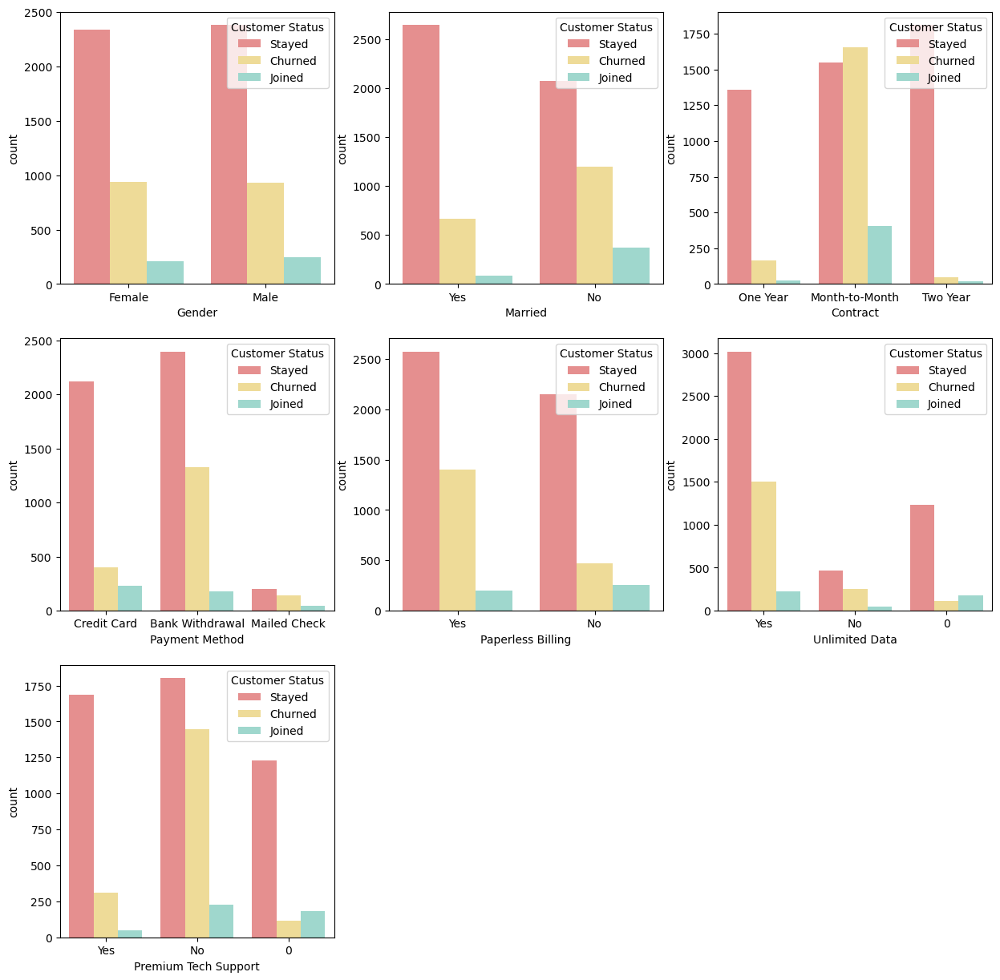

In [262]:
fig = plt.figure(figsize = (15, 15))

columns_list = ['Gender',
 'Married',
 'Contract',
 'Payment Method',
 'Paperless Billing',
 'Unlimited Data',
 'Premium Tech Support']

i = 1
for c in columns_list:
    plt.subplot(3, 3, i)
    ax = sns.countplot(data = df, x = df[c], hue = 'Customer Status', palette = ['#F38181','#FCE38A','#95E1D3'])
    #plt.title(str(c), loc='center')
    #plt.xticks(rotation = 20, fontsize = 10)
    i += 1


**Findings**
> 1. Male and Female are equally tend to churn as dataset does not show significant differnece based on gender.
2. Unmarried customers are comparively more churning as compare to married customers
3. month to month contract customers are churning more.
4. customers having Bank withdrawl payment method are churning more.
5. Paperless billing customers are churning more.
6. Customers who does not opted to Premium Tech support are churning more

## Feature Engineering

>**Looking for Correlations**

>Before proceeding with the feature selection, it is useful to establish a correlation between the response variable (in our case the Customer Status) and other predictor variables, as some of them might not have any major impact in determining Churnforecasting and will not be used in the analysis. There are many ways to discover correlation between the target variable and the rest of the features. Building pair plots, scatter plots, heat maps, and a correlation matrixes are the most common ones. Below, we will use the corr() function to list the top features based on the pearson correlation coefficient (measures how closely two sequences of numbers are correlated). Correlation coefficient can only be calculated on the numerical attributes (floats and integers), therefore, only the numeric attributes will be selected.

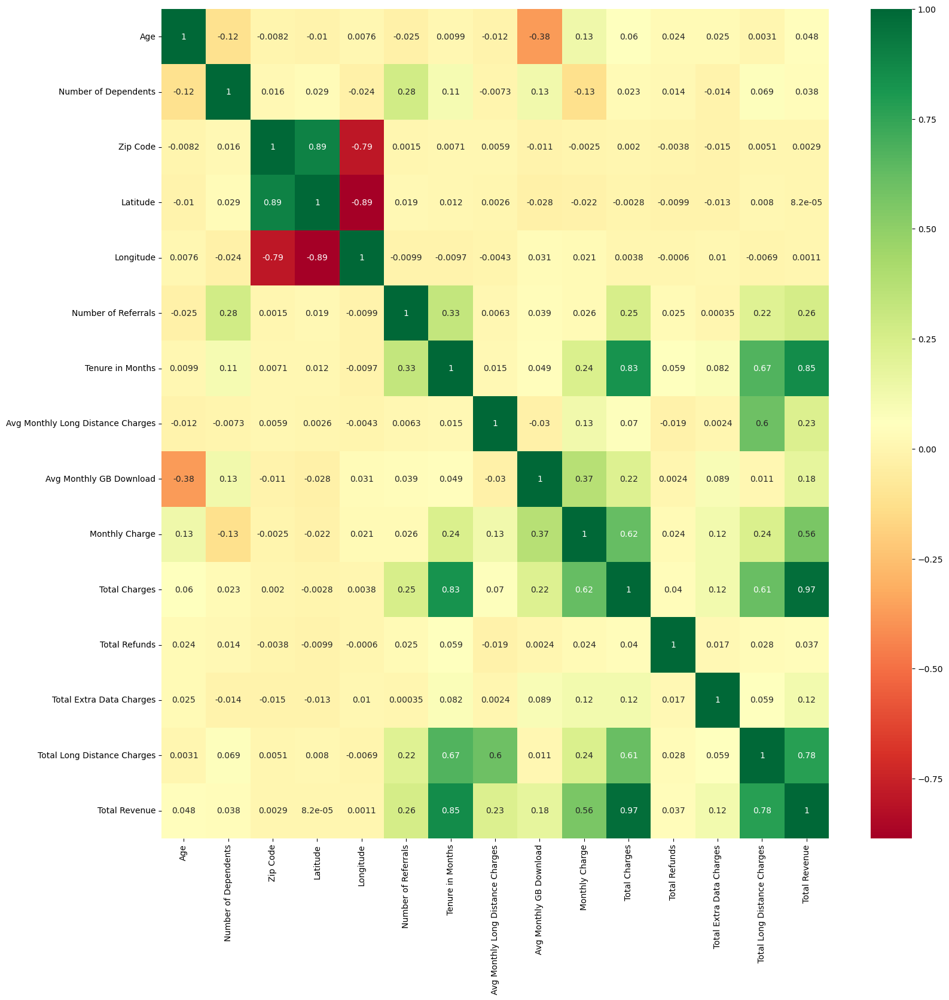

In [263]:
plt.figure(figsize=(18,18))
sns.heatmap(df.corr(),annot=True,cmap='RdYlGn')

plt.show()

**There are few columns which have strong correlation , and that may cause problem of colinearity. Thus we will drop those columns.**

In [264]:
df=df.drop(columns=['Zip Code','Longitude','Latitude','City'])

 ### Selection of required columns

>1. There are columns such as `Customer ID`,`Churn Category`,`Churn Reason`,`Total Refunds` has no significant data. So we will drop these columns.

>2. Our objective for this anlysis is to predictt whether customer going to churn or not, so we will drop the data of newly joined customers

In [265]:
df=df.drop(columns=['Customer ID','Churn Category','Churn Reason','Total Refunds'])

In [266]:
Final_df = df[df['Customer Status']!='Joined']


In [267]:
Final_df.shape

(6589, 30)

### **Feature Transformation**

Feature Transformation means transforming our features to the functions of the original features. For example, feature encoding, scaling, and discretization (the process of transforming continuous variables into discrete form, by creating bins or intervals) are the most common forms of data transformation.


### Dealing with Categorical Variables

Categorical variables represent qualitative data with no apparent inherent mathematical meaning. Therefore, for any machine learning analysis, all the categorical data must be transformed into the numerical data types. First, We will use `unique()` method to obtain all the categories in this column.


### *one hot encoding*

Now, to be recognized by a machine learning algorithms, our categorical variables should be converted into numerical ones. One way to do this is through *one hot encoding*. 

We will use, `get_dummies()` method to do this transformation.

In [268]:
Final_df.nunique()

Gender                                  2
Age                                    62
Married                                 2
Number of Dependents                   10
Number of Referrals                    12
Tenure in Months                       72
Offer                                   6
Phone Service                           2
Avg Monthly Long Distance Charges    3452
Multiple Lines                          3
Internet Service                        2
Internet Type                           4
Avg Monthly GB Download                50
Online Security                         3
Online Backup                           3
Device Protection Plan                  3
Premium Tech Support                    3
Streaming TV                            3
Streaming Movies                        3
Streaming Music                         3
Unlimited Data                          3
Contract                                3
Paperless Billing                       2
Payment Method                    

In [269]:
Categorical_columns = ['Gender','Married','Offer','Phone Service','Multiple Lines','Internet Service','Internet Type','Online Security',
 'Online Backup','Device Protection Plan','Premium Tech Support','Streaming TV','Streaming Movies','Streaming Music','Unlimited Data','Contract','Paperless Billing','Payment Method',]

In [270]:
Final_df_1 = pd.get_dummies(data=Final_df, columns = Categorical_columns)
Final_df_1.head()

,Age,Number of Dependents,Number of Referrals,Tenure in Months,Avg Monthly Long Distance Charges,Avg Monthly GB Download,Monthly Charge,Total Charges,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Customer Status,Gender_Female,Gender_Male,Married_No,Married_Yes,Offer_None,Offer_Offer A,Offer_Offer B,Offer_Offer C,Offer_Offer D,Offer_Offer E,Phone Service_No,Phone Service_Yes,Multiple Lines_NPS,Multiple Lines_No,Multiple Lines_Yes,Internet Service_No,Internet Service_Yes,Internet Type_0,Internet Type_Cable,Internet Type_DSL,Internet Type_Fiber Optic,Online Security_0,Online Security_No,Online Security_Yes,Online Backup_0,Online Backup_No,Online Backup_Yes,Device Protection Plan_0,Device Protection Plan_No,Device Protection Plan_Yes,Premium Tech Support_0,Premium Tech Support_No,Premium Tech Support_Yes,Streaming TV_0,Streaming TV_No,Streaming TV_Yes,Streaming Movies_0,Streaming Movies_No,Streaming Movies_Yes,Streaming Music_0,Streaming Music_No,Streaming Music_Yes,Unlimited Data_0,Unlimited Data_No,Unlimited Data_Yes,Contract_Month-to-Month,Contract_One Year,Contract_Two Year,Paperless Billing_No,Paperless Billing_Yes,Payment Method_Bank Withdrawal,Payment Method_Credit Card,Payment Method_Mailed Check
0,37,0,2,9,42.39,16.0,65.6,593.30,0,381.51,974.81,Stayed,1,0,0,1,1,0,0,0,0,0,0,1,0,1,0,0,1,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,1,0,1,0,0,1,0,0,0,1,0,1,0,0,1,0,1,0
1,46,0,0,9,10.69,10.0,-4.0,542.40,10,96.21,610.28,Stayed,0,1,1,0,1,0,0,0,0,0,0,1,0,0,1,0,1,0,1,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,1,0,1,0,0,1,0,0,1,0
2,50,0,0,4,33.65,30.0,73.9,280.85,0,134.60,415.45,Churned,0,1,1,0,0,0,0,0,0,1,0,1,0,1,0,0,1,0,0,0,1,0,1,0,0,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,1,0,0,0,1,1,0,0
3,78,0,1,13,27.82,4.0,98.0,1237.85,0,361.66,1599.51,Churned,0,1,0,1,0,0,0,0,1,0,0,1,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,1,0,1,0,0,0,1,0,0,1,0,1,0,0,0,1,1,0,0,0,1,1,0,0
4,75,0,3,3,7.38,11.0,83.9,267.40,0,22.14,289.54,Churned,1,0,0,1,1,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,1,0,0,1,0,0,0,1,1,0,0,0,1,0,1,0


### Feature Scaling

In [271]:
from sklearn.preprocessing import StandardScaler
scale = StandardScaler()
Num_columns = ['Age','Number of Dependents','Number of Referrals','Tenure in Months','Avg Monthly Long Distance Charges','Avg Monthly GB Download','Total Charges',
               'Total Extra Data Charges','Total Long Distance Charges','Total Revenue','Monthly Charge']
Final_df_1[Num_columns] = scale.fit_transform(Final_df_1[Num_columns])

In [272]:
Final_df_1.head()

,Age,Number of Dependents,Number of Referrals,Tenure in Months,Avg Monthly Long Distance Charges,Avg Monthly GB Download,Monthly Charge,Total Charges,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Customer Status,Gender_Female,Gender_Male,Married_No,Married_Yes,Offer_None,Offer_Offer A,Offer_Offer B,Offer_Offer C,Offer_Offer D,Offer_Offer E,Phone Service_No,Phone Service_Yes,Multiple Lines_NPS,Multiple Lines_No,Multiple Lines_Yes,Internet Service_No,Internet Service_Yes,Internet Type_0,Internet Type_Cable,Internet Type_DSL,Internet Type_Fiber Optic,Online Security_0,Online Security_No,Online Security_Yes,Online Backup_0,Online Backup_No,Online Backup_Yes,Device Protection Plan_0,Device Protection Plan_No,Device Protection Plan_Yes,Premium Tech Support_0,Premium Tech Support_No,Premium Tech Support_Yes,Streaming TV_0,Streaming TV_No,Streaming TV_Yes,Streaming Movies_0,Streaming Movies_No,Streaming Movies_Yes,Streaming Music_0,Streaming Music_No,Streaming Music_Yes,Unlimited Data_0,Unlimited Data_No,Unlimited Data_Yes,Contract_Month-to-Month,Contract_One Year,Contract_Two Year,Paperless Billing_No,Paperless Billing_Yes,Payment Method_Bank Withdrawal,Payment Method_Credit Card,Payment Method_Mailed Check
0,-0.579600,-0.491619,-0.006926,-1.063957,1.253468,-0.238987,0.018307,-0.811689,-0.277876,-0.487965,-0.791908,Stayed,1,0,0,1,1,0,0,0,0,0,0,1,0,1,0,0,1,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,1,0,1,0,0,1,0,0,0,1,0,1,0,0,1,0,1,0
1,-0.045161,-0.491619,-0.668349,-1.063957,-0.796233,-0.533037,-2.219753,-0.834158,0.109703,-0.822156,-0.919617,Stayed,0,1,1,0,1,0,0,0,0,0,0,1,0,0,1,0,1,0,1,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,1,0,1,0,0,1,0,0,1,0
2,0.192368,-0.491619,-0.668349,-1.272578,0.688345,0.447129,0.285202,-0.949616,-0.277876,-0.777187,-0.987873,Churned,0,1,1,0,0,0,0,0,0,1,0,1,0,1,0,0,1,0,0,0,1,0,1,0,0,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,1,0,0,0,1,1,0,0
3,1.855067,-0.491619,-0.337638,-0.897060,0.311381,-0.827087,1.060162,-0.527161,-0.277876,-0.511217,-0.573051,Churned,0,1,0,1,0,0,0,0,1,0,0,1,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,1,0,1,0,0,0,1,0,0,1,0,1,0,0,0,1,1,0,0,0,1,1,0,0
4,1.676921,-0.491619,0.323785,-1.314302,-1.010255,-0.484029,0.606762,-0.955553,-0.277876,-0.908919,-1.031984,Churned,1,0,0,1,1,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,1,0,0,1,0,0,0,1,1,0,0,0,1,0,1,0


### Check for Target Variable data distribution

Stayed     4720
Churned    1869
Name: Customer Status, dtype: int64

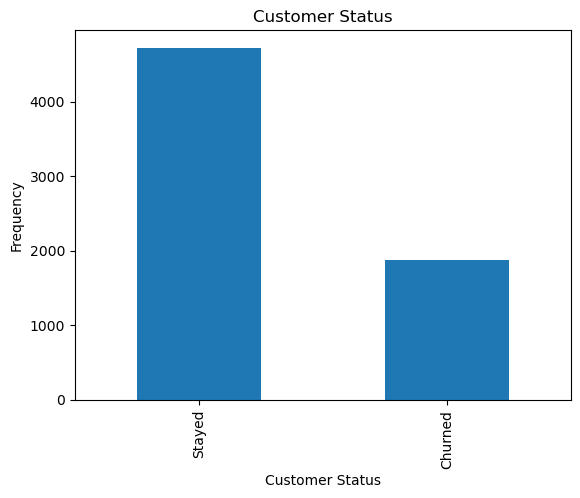

In [273]:
pd.value_counts(Final_df_1['Customer Status']).plot.bar()
plt.title('Customer Status')
plt.xlabel('Customer Status')
plt.ylabel('Frequency')
Final_df_1['Customer Status'].value_counts()

## Spliting Dependant and Independant variables ,Train Test Split

In [291]:
X = Final_df_1.drop(columns = ['Customer Status'])
y = Final_df_1['Customer Status']
y= y.apply(lambda x:1 if 'Churned' in x else 0)
print('Shape of X: {}'.format(X.shape))
print('Shape of y: {}'.format(y.shape))

Shape of X: (6589, 64)
Shape of y: (6589,)


In [342]:
from sklearn.model_selection import train_test_split
  
# split into 75:25 ration
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 15)
  
# describes info about train and test set
print("Number transactions X_train dataset: ", X_train.shape)
print("Number transactions y_train dataset: ", y_train.shape)
print("Number transactions X_test dataset: ", X_test.shape)
print("Number transactions y_test dataset: ", y_test.shape)

Number transactions X_train dataset:  (4941, 64)
Number transactions y_train dataset:  (4941,)
Number transactions X_test dataset:  (1648, 64)
Number transactions y_test dataset:  (1648,)


In [343]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, classification_report



## SMOTE

In [344]:

print("Before OverSampling, counts of label 'Stayed': {}".format(sum(y_train == 0)))
print("Before OverSampling, counts of label 'Churned': {} \n".format(sum(y_train == 1)))
  
# import SMOTE module from imblearn library
#pip install imblearn (if you don't have imblearn in your system)
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state = 40)
X_train_res, y_train_res = sm.fit_resample(X_train, y_train.ravel())
  
print('After OverSampling, the shape of train_X: {}'.format(X_train_res.shape))
print('After OverSampling, the shape of train_y: {} \n'.format(y_train_res.shape))
  
print("After OverSampling, counts of label 'Stayed': {}".format(sum(y_train_res == 0)))
print("After OverSampling, counts of label 'Churned': {}".format(sum(y_train_res == 1)))

Before OverSampling, counts of label 'Stayed': 3536
Before OverSampling, counts of label 'Churned': 1405 

After OverSampling, the shape of train_X: (7072, 64)
After OverSampling, the shape of train_y: (7072,) 

After OverSampling, counts of label 'Stayed': 3536
After OverSampling, counts of label 'Churned': 3536


### LogisticRegression Before Balancing the Target Variable

In [345]:
# logistic regression object
lr = LogisticRegression()
  
# train the model on train set
lr.fit(X_train, y_train.ravel())
  
predictions = lr.predict(X_test)
  
# print classification report
print(classification_report(y_test, predictions))

              precision    recall  f1-score   support

           0       0.91      0.91      0.91      1184
           1       0.77      0.77      0.77       464

    accuracy                           0.87      1648
   macro avg       0.84      0.84      0.84      1648
weighted avg       0.87      0.87      0.87      1648



### LogisticRegression After Balancing the Target Variable

In [346]:
lr1 = LogisticRegression()
lr1.fit(X_train_res, y_train_res.ravel())
predictions = lr1.predict(X_test)
  
# print classification report
print(classification_report(y_test, predictions))

              precision    recall  f1-score   support

           0       0.92      0.89      0.90      1184
           1       0.74      0.80      0.77       464

    accuracy                           0.86      1648
   macro avg       0.83      0.84      0.83      1648
weighted avg       0.87      0.86      0.86      1648



### RandomForestClassifier Before Balancing the Target Variable

In [347]:
rmf = RandomForestClassifier()
  
# train the model on train set
rmf.fit(X_train, y_train.ravel())
  
predictions = rmf.predict(X_test)
  
# print classification report
print(classification_report(y_test, predictions))

              precision    recall  f1-score   support

           0       0.89      0.95      0.92      1184
           1       0.84      0.69      0.76       464

    accuracy                           0.88      1648
   macro avg       0.87      0.82      0.84      1648
weighted avg       0.87      0.88      0.87      1648



### RandomForestClassifier After Balancing the Target Variable

In [348]:
rmf1 = RandomForestClassifier()
rmf1.fit(X_train_res, y_train_res.ravel())
predictions = rmf1.predict(X_test)
  
# print classification report
print(classification_report(y_test, predictions))

              precision    recall  f1-score   support

           0       0.92      0.92      0.92      1184
           1       0.80      0.78      0.79       464

    accuracy                           0.89      1648
   macro avg       0.86      0.85      0.86      1648
weighted avg       0.88      0.89      0.88      1648



In Customer Churn prediction model, we are interested in how much truely churned customers are rightly predicted by our model and that is given by Recall. Here we got **Accuaracy of 89%** for balanced data and **Recall of 78%** with Random Forest model

## Finding optimized random state:

In [349]:
for i in range(50):    
    from sklearn.model_selection import train_test_split

    # split into 75:25 ration
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = i)

    from imblearn.over_sampling import SMOTE
    sm = SMOTE(random_state = 40)
    X_train_res, y_train_res = sm.fit_resample(X_train, y_train.ravel())

    # logistic regression object
    lr = LogisticRegression()

    # train the model on train set
    lr.fit(X_train, y_train.ravel())

    predictions = lr.predict(X_test)

    # print classification report
    print('Logistic at random value :',i,'\n',classification_report(y_test, predictions))


    lr1 = LogisticRegression()
    lr1.fit(X_train_res, y_train_res.ravel())
    predictions = lr1.predict(X_test)

    # print classification report
    print('Logistic1 at random value :',i,'\n',classification_report(y_test, predictions))

    rmf = RandomForestClassifier()

    # train the model on train set
    rmf.fit(X_train, y_train.ravel())

    predictions = rmf.predict(X_test)

    # print classification report
    print('Random forest at random value :',i,'\n',classification_report(y_test, predictions))


    rmf1 = RandomForestClassifier()
    rmf1.fit(X_train_res, y_train_res.ravel())
    predictions = rmf1.predict(X_test)

    # print classification report
    print('Random forest 1 at random value :',i,'\n', classification_report(y_test, predictions))
    
    

Logistic at random value : 0 
               precision    recall  f1-score   support

           0       0.90      0.89      0.90      1205
           1       0.72      0.74      0.73       443

    accuracy                           0.85      1648
   macro avg       0.81      0.82      0.81      1648
weighted avg       0.85      0.85      0.85      1648

Logistic1 at random value : 0 
               precision    recall  f1-score   support

           0       0.91      0.88      0.90      1205
           1       0.71      0.77      0.74       443

    accuracy                           0.85      1648
   macro avg       0.81      0.83      0.82      1648
weighted avg       0.86      0.85      0.86      1648

Random forest at random value : 0 
               precision    recall  f1-score   support

           0       0.89      0.94      0.92      1205
           1       0.81      0.70      0.75       443

    accuracy                           0.88      1648
   macro avg       0.85      